In [16]:
from IPython.display import display, HTML
import pandas as pd
import numpy as np
import pearson_correlation as ps
import pre_processing as pre
import graphic as gr
import download_file as dl
from pca import pca 
import matplotlib.pyplot as plt  
from statsmodels.graphics.gofplots import qqplot 
plt.rcParams["figure.figsize"] =(22,15)

In [17]:

#----------------------------------------READ-DATA-----------------------------------------------------
data = dl.read_file() 
wind_turbine = data[data['Wind_turbine_name'] =='R80721']
wind_turbine = pre.extract_value_avg(wind_turbine.copy())
  
#----------------------------------------READ-DATA-----------------------------------------------------
  

In [18]:

#----------------------------------------PEARSON-----------------------------------------------------
pearson_matrix = ps.pearson_correlation(wind_turbine)  
result = ps.transform_value(pearson_matrix)
result=result.astype(float)
#gr.seaborn_pearson_plot(result)  
#----------------------------------------PEARSON-----------------------------------------------------

In [19]:

#-----------------------------------FILLNaNVALUES AND SELECT TARGET----------------------------------
wind_turbine = pre.fill_NaN_values(wind_turbine.copy())
y_train =pre.select_y(wind_turbine)
wind_turbine = wind_turbine.drop('Rbt_avg',axis=1)   

#-----------------------------------FILLNaNVALUES AND SELECT TARGET----------------------------------


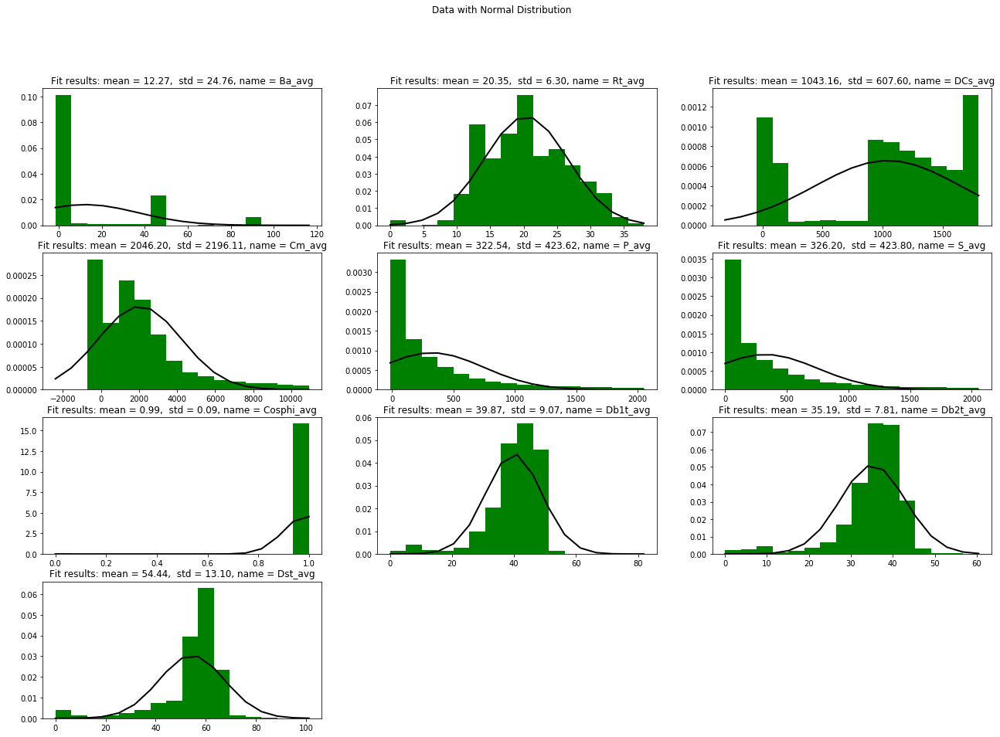

In [20]:

gr.create_my_plot(wind_turbine.iloc[:,0:10])    
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C046553188>,
      dtype=object)

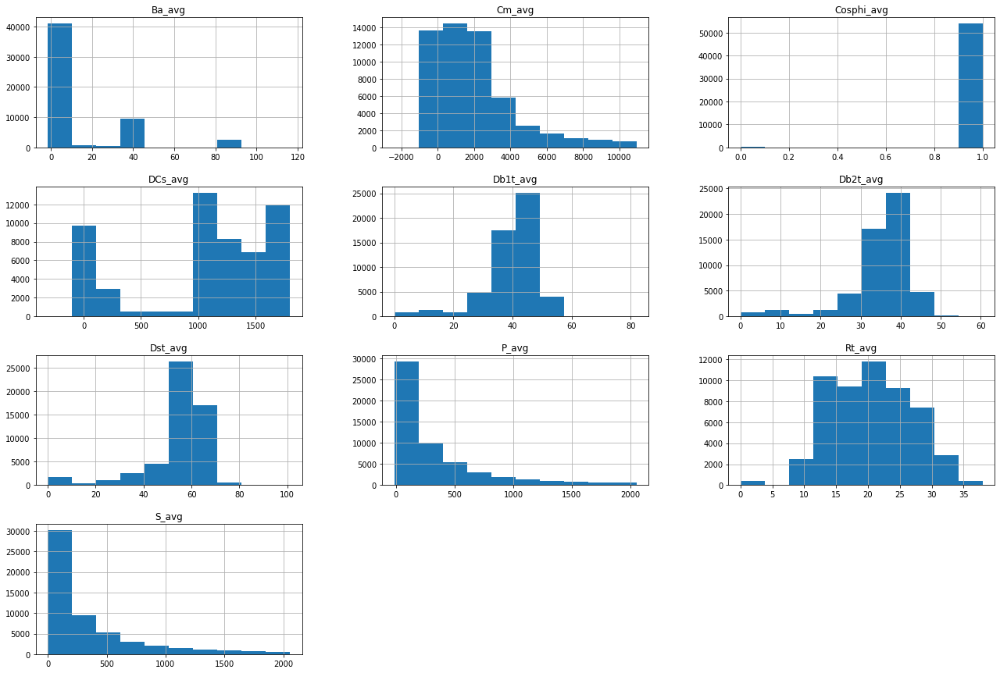

In [21]:
wind_turbine.iloc[:,0:10].hist(figsize =(22,15))

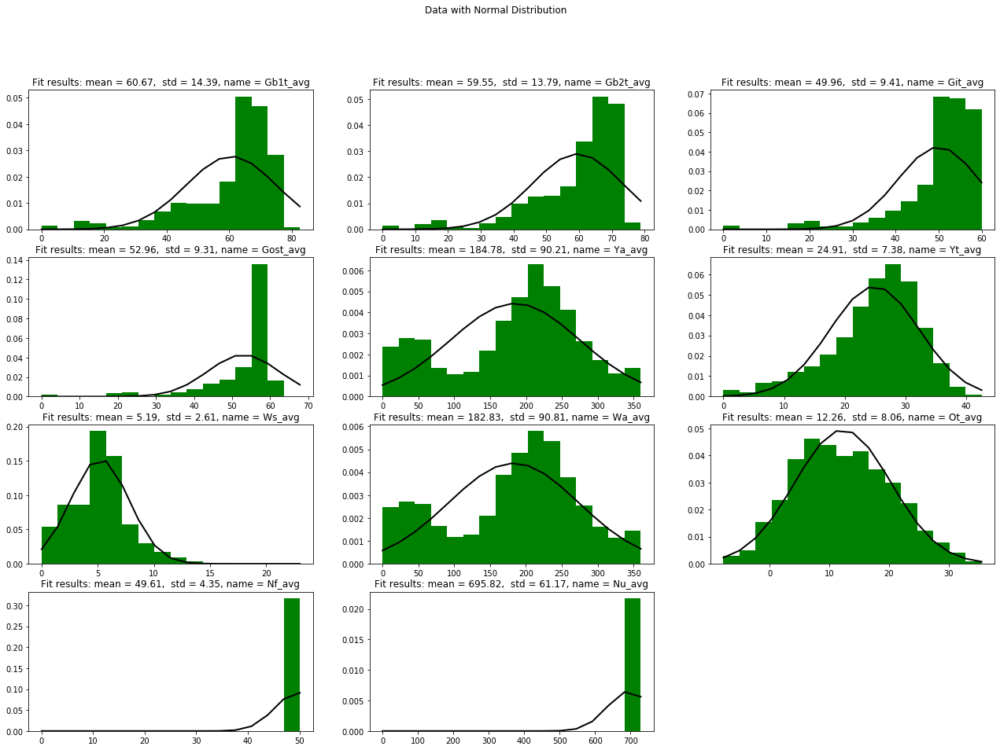

In [22]:
gr.create_my_plot(wind_turbine.iloc[:,10:])    
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C047361B48>,
      dtype=object)

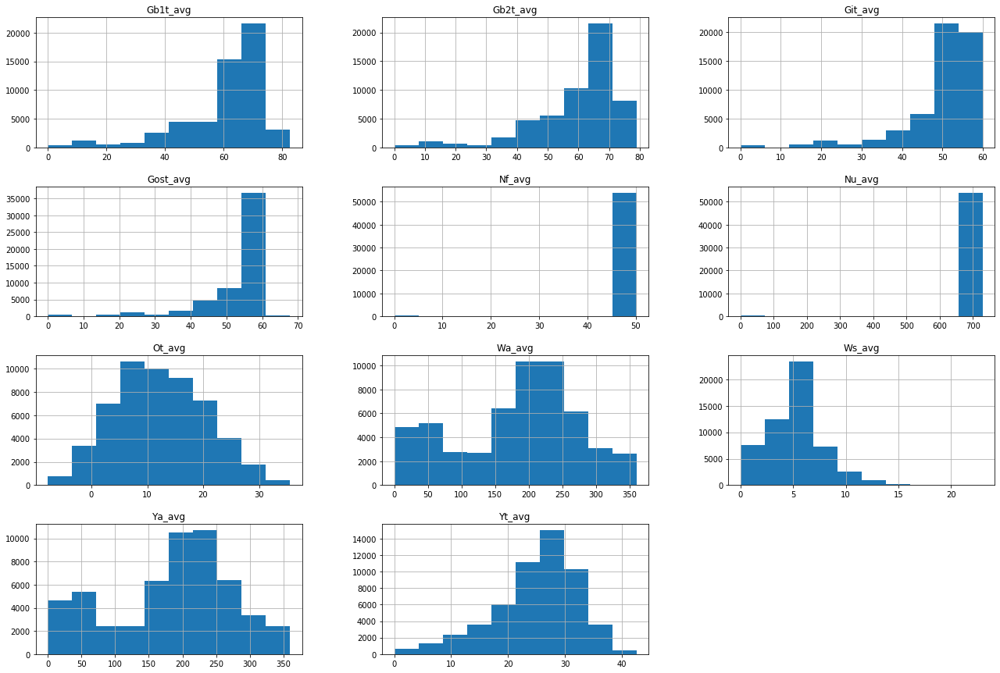

In [23]:
wind_turbine.iloc[:,10:].hist(figsize =(22,15))

In [24]:

#-----------------------------------SPLIT AND STANDARIZE DATA ---------------------------------------
x_train, x_test, y_train, y_test = pre.train_test_split(wind_turbine,y_train)  
x_train = pre.standardize(x_train)
x_test = pre.standardize(x_test)  
#-----------------------------------SPLIT AND STANDARIZE DATA ---------------------------------------


In [25]:
#-----------------------------------VIEW OUTLIER --------------------------------------------------
 
model = pca(alpha=0.05, n_std=3,n_components=0.95)
out = model.fit_transform(x_train)  



[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [21] columns of the input data.
[pca] >Fitting using PCA..


LinAlgError: SVD did not converge

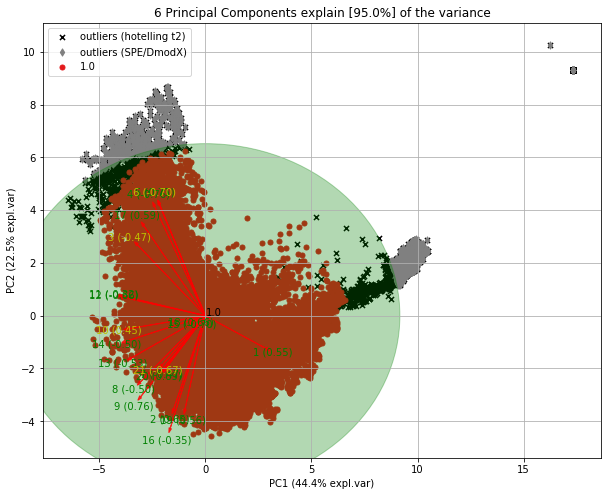

(<Figure size 720x576 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1f5e05bdc88>)

In [28]:

# Create only the scatter plots
model.biplot(legend=True, SPE=True, hotellingt2=True) 

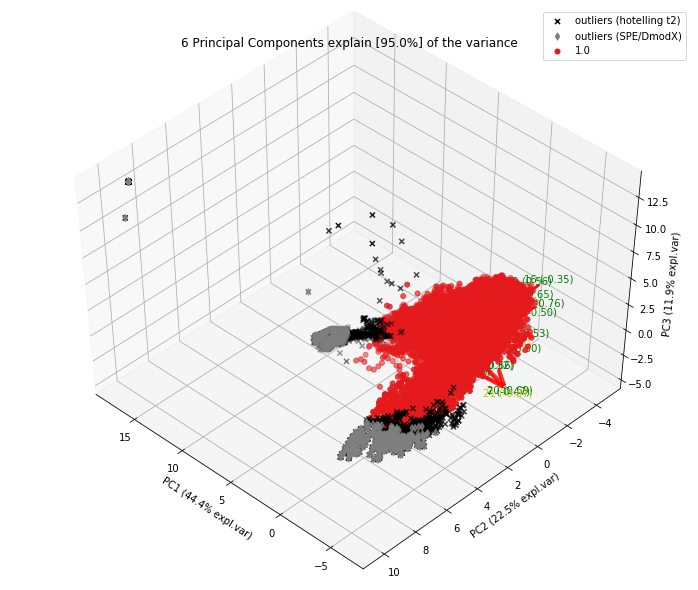

(<Figure size 720x576 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x1f5e0c94d88>)

In [29]:

model.biplot3d(legend=True, SPE=True, hotellingt2=True)  
#-----------------------------------VIEW OUTLIER --------------------------------------------------

15.732193929958447

1

<Figure size 432x288 with 0 Axes>

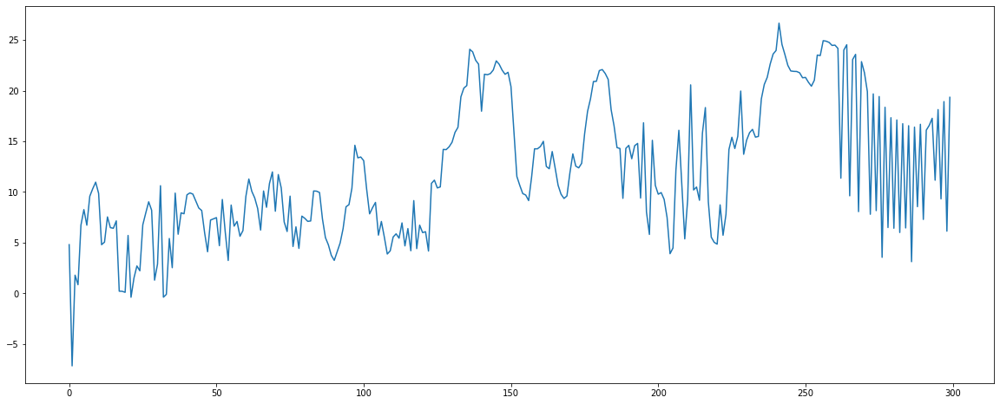

In [20]:

#-----------------------------------PLOT ORIGINAL AND STANDAR DATA ---------------------------------

plt.figure()
ba_avg_data_graph = wind_turbine.Ot_avg.head(300) 
 
gr.linear_graph_unique(ba_avg_data_graph)


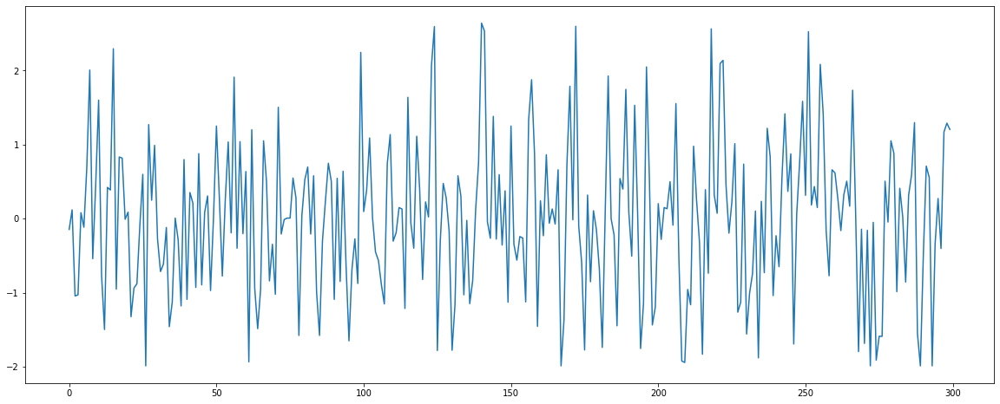

In [32]:

one_column_select = x_train[0:300,16:17]
gr.linear_graph_unique(one_column_select)#[start_row_index:end_row_index, start_column_index:end_column_index] 
gr.plot_image()
#-----------------------------------PLOT ORIGINAL AND STANDAR DATA ---------------------------------

Feature 0: 18166.928079
Feature 1: 48186.318835
Feature 2: 14858.721533
Feature 3: 4471.357996
Feature 4: 3321.525969
Feature 5: 3267.535255
Feature 6: 5709.149362
Feature 7: 54521.961503
Feature 8: 117379.859382
Feature 9: 71051.336082
Feature 10: 65362.273365
Feature 11: 68873.727262
Feature 12: 73798.452056
Feature 13: 106424.497088
Feature 14: 465.199643
Feature 15: 25910.900249
Feature 16: 9561.948625
Feature 17: 433.481993
Feature 18: 26912.794941
Feature 19: 6398.465013
Feature 20: 6601.630128


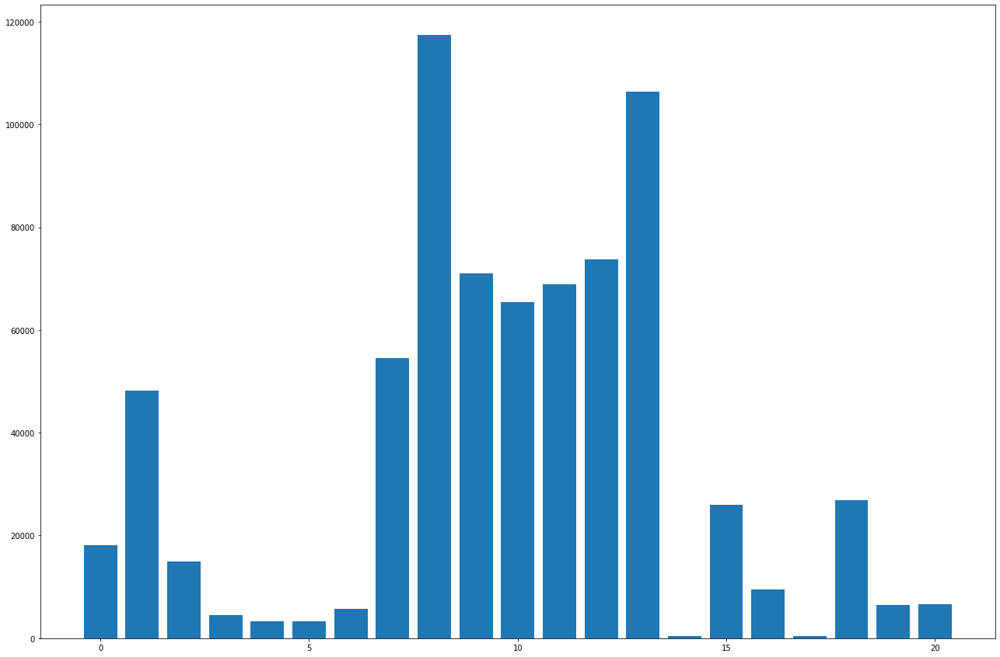

Feature 0: 0.364185
Feature 1: 0.821745
Feature 2: 0.331081
Feature 3: 0.333972
Feature 4: 0.324976
Feature 5: 0.330095
Feature 6: 0.205167
Feature 7: 0.507958
Feature 8: 0.661358
Feature 9: 0.504360
Feature 10: 0.554172
Feature 11: 0.593896
Feature 12: 0.501086
Feature 13: 0.584464
Feature 14: 0.765934
Feature 15: 0.498005
Feature 16: 0.239154
Feature 17: 0.216043
Feature 18: 0.719091
Feature 19: 0.137323
Feature 20: 0.128012


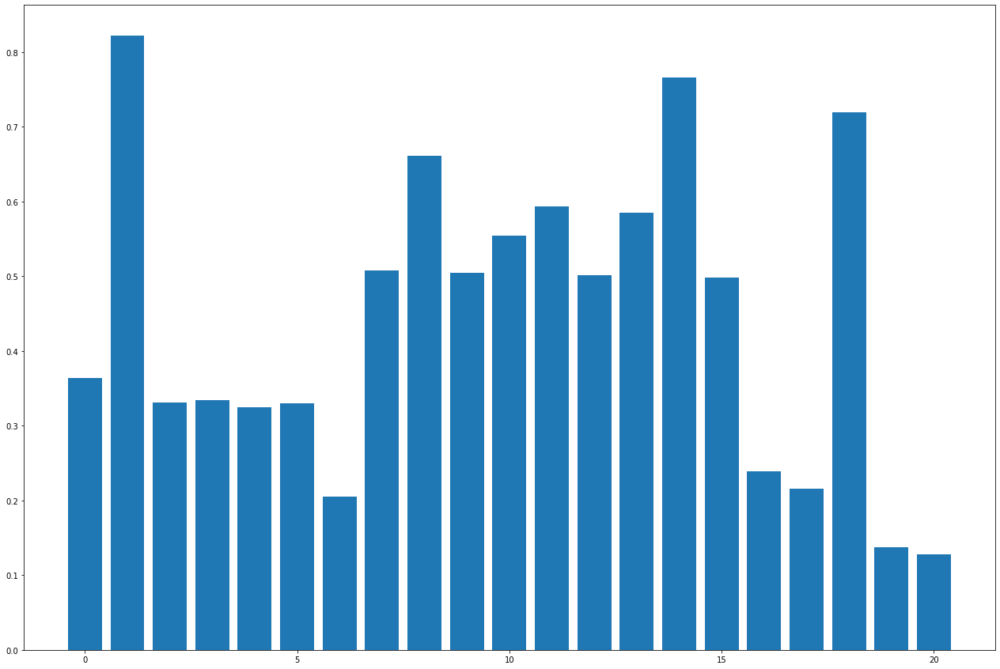

In [33]:

#----------------------------------PLOT BEST FEATURES ---------------------------------------------

new_x_train,new_x_test,selectBest = pre.select_best_f_regression(x_train,y_train,'all',x_test) 
gr.plot_feature_selection(selectBest) 
new_x_train,new_x_test,selectBest = pre.select_best_mutual_f_regression(x_train,y_train,'all',x_test)
gr.plot_feature_selection(selectBest)
#----------------------------------PLOT BEST FEATURES --------------------------------------------- 